In [1]:
import os
import json
import glob
import pandas as pd
import numpy as np
import pickle
from sklearn.preprocessing import MaxAbsScaler
from nilearn.input_data import NiftiLabelsMasker
from nilearn import plotting
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import scipy as sp
import scipy.cluster.hierarchy as hc
import seaborn as sns

/Users/walters/opt/anaconda3/envs/multitask_env/lib/python3.7/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [9]:
def get_avg_betas_in_networks(betas, parcel_info, network_names): 
    network_dict = {k:[] for k in network_names}
    for n in network_names:
        network_indices = parcel_info[1].str.contains(n)
        betas_filtered = betas[network_indices]
        network_dict[n] = np.average(betas_filtered, axis=0)
    return network_dict


def plot_concept_weights(cogatlas_name, betas, masker, concept_idx_dict):
    key_list = list(concept_idx_dict.keys()) 
    val_list = list(concept_idx_dict.values())
    concept_id = key_list[val_list.index(cogatlas_name.lower())]

    concept_vec = betas[:, concept_id]
    concept_vec = masker.inverse_transform([concept_vec])
    title = cogatlas_name    
    plotting.plot_glass_brain(concept_vec, title=title, plot_abs=False, display_mode='lzry', 
                              colorbar=True, cmap='coolwarm')

In [10]:
## Params
firstlevel_label = 'first_level_bySession'
analysis_name = 'analysis-3_savedCoefs'
feature_set = 'all'
num_parcels = 1000
model_name = 'RidgeCV'
parc_label = 'schaefer_2018'
space_label = 'MNI152NLin2009cAsym'


## Paths
proj_dir = os.path.abspath(os.path.join(os.getcwd(), '../..'))
output_dir = os.path.join(proj_dir, 'model_outputs')
resources_dir = os.path.join(proj_dir, 'resources')
firstlevel_dir = os.path.join(proj_dir, 'Y_data', firstlevel_label)
results_dir = os.path.join(output_dir, firstlevel_label, analysis_name, model_name)
features_dir = os.path.join(proj_dir, 'X_features')
parcellations_dir = os.path.join(proj_dir, 'Y_data/parcellation_schemes', parc_label)
figures_dir = os.path.join(proj_dir, 'figures', firstlevel_label, analysis_name)


## Load task2task dict (for more readable naming format), and get task order
with open(os.path.join(resources_dir, 'dicts/task2task.json'), 'rb') as f:
    task2task = json.load(f)
task2task_inv = {v: k for k, v in task2task.items()}


## Load X
X_byTask_dir = os.path.join(features_dir, 'byTask', 'X_all.csv')
X_byTask = pd.read_csv(X_byTask_dir, index_col=0)
features = X_byTask.columns.tolist()
tasks = X_byTask.index.tolist()
concept_idx_dict = {i:c for i,c in enumerate(features)}

X_byTaskbySession_dir = os.path.join(features_dir, 'byTask_bySession', 'X_all.csv')
X_byTaskbySession = pd.read_csv(X_byTaskbySession_dir, index_col=0)
X_mat = X_byTaskbySession.filter(features)


## Load model parameters 

# Get list of pkl files
dict_list = []
res_files = sorted(glob.glob(os.path.join(results_dir, '*')))
for f in res_files:
    with open(f, 'rb') as f:
        dict_list.append(pickle.load(f)) 

# Aggregate into df
cols = ['parcels', 'feature_set', 'model_name', 'sub', 'coefs', 'intercepts']
param_df = pd.DataFrame(columns=cols)

for d in dict_list:
    num_parcels = list(d.keys())[0]
    feature_set = list(d[num_parcels].keys())[0]
    model_name = list(d[num_parcels][feature_set].keys())[0]
    sub = list(d[num_parcels][feature_set][model_name].keys())[0]
    metrics = list(d[num_parcels][feature_set][model_name][sub].keys())
    sub_res = d[num_parcels][feature_set][model_name][sub]
    
    row = [num_parcels, feature_set, model_name, sub, sub_res['coefs'][0], sub_res['intercepts'][0]]
    param_df = param_df.append(pd.Series(row, index=cols), ignore_index=True)
    

## Define subs
subs = param_df['sub'].unique().tolist()

In [11]:
## Get average betas
res_df = param_df

avg_betas = np.mean(np.array(res_df['coefs'].to_list()), axis=0)

# Get network label for each region
parcel_network_file = os.path.join(parcellations_dir, f'Schaefer2018_{num_parcels}Parcels_7Networks_order.txt')
with open(parcel_network_file, 'rb') as f:
    parcel_info = pd.read_csv(f, sep="\t", header=None)
    
# Get average beta for each cognitive function in each network
network_names = ['Vis','SomMot','DorsAttn','SalVentAttn','Limbic','Cont','Default']
full_network_names = ['Visual Network','Somatomotor Network','Dorsal Attention Network',
                      'Ventral Attention / Salience Network','Limbic Network',
                      'Frontoparietal Control Network','Default Mode Network']
network_name_dict = {n1:n2 for n1, n2 in zip(network_names, full_network_names)}
network_dict = get_avg_betas_in_networks(avg_betas, parcel_info, network_names)



# top 5
top5_concept_indices = {n:None for n in network_names}
top5_concept_names = {n:None for n in network_names}
for k in network_dict.keys():
    indices = list(network_dict[k].argsort()[-5:])
    indices.reverse()
    names = [concept_idx_dict[i] for i in indices]
    top5_concept_indices[k] = indices
    top5_concept_names[k] = names
    
    
# all
top_n = len(features)
top_concept_indices = {n:None for n in network_names}
top_concept_names = {n:None for n in network_names}
top_concept_values = {n:None for n in network_names}
for k in network_dict.keys():
    indices = list(network_dict[k].argsort()[-top_n:])
    indices.reverse()
    names = [concept_idx_dict[i] for i in indices]
    values = network_dict[k][indices]
    top_concept_indices[k] = indices
    top_concept_names[k] = names
    top_concept_values[k] = values

In [12]:
# For each network, print all features sorted (high to low) by the average coefficient weight within the network

for k in top_concept_names.keys():
    print(network_name_dict[k])
    print()
    for i in range(top_n):
        print('%0.3f\t%s' % (top_concept_values[k][i], top_concept_names[k][i]))
    print()
    print()

Visual Network

0.729	visual object recognition
0.412	face perception
0.383	narrative
0.270	theory of mind
0.223	visual letter recognition
0.212	visual scene perception
0.203	emotion recognition
0.193	negative emotion
0.176	spatial selective attention
0.156	task switching
0.136	feedback processing
0.101	working memory maintenance
0.085	positive emotion
0.066	word generation
0.046	response alternatives
0.043	visual number recognition
0.039	visual motion perception
0.024	sentence processing
0.003	visual working memory
0.001	semantic retrieval
-0.004	inhibition
-0.009	motor planning
-0.028	biological motion
-0.031	mental arithmetic
-0.033	visual imagery
-0.048	motor imagery
-0.065	left hand response execution
-0.139	expectation violation
-0.150	visual shape perception
-0.154	auditory tone discrimination
-0.161	updating
-0.172	interference resolution
-0.226	visual word recognition
-0.264	phonological working memory
-0.277	right hand response execution
-0.492	autobiographical recall


Somat

In [13]:
print('Top 5 terms per network:\n') 
for k, v in top5_concept_names.items():
    print('%s:' % network_name_dict[k])
    for i in v:
        print(i)
    print()

Top 5 terms per network:

Visual Network:
visual object recognition
face perception
narrative
theory of mind
visual letter recognition

Somatomotor Network:
autobiographical recall
motor planning
left hand response execution
visual word recognition
visual motion perception

Dorsal Attention Network:
biological motion
visual imagery
working memory maintenance
visual object recognition
motor planning

Ventral Attention / Salience Network:
visual shape perception
biological motion
right hand response execution
left hand response execution
motor planning

Limbic Network:
negative emotion
visual scene perception
autobiographical recall
positive emotion
sentence processing

Frontoparietal Control Network:
updating
visual shape perception
working memory maintenance
visual working memory
right hand response execution

Default Mode Network:
theory of mind
narrative
sentence processing
visual scene perception
visual letter recognition



In [14]:
# Masker
atlas_img = glob.glob(os.path.join(parcellations_dir, f'*Asym*{num_parcels}Parcels*nii.gz'))[0]
masker = NiftiLabelsMasker(labels_img=atlas_img)
masker.fit()

NiftiLabelsMasker(labels_img='/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/parcellation_schemes/schaefer_2018/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.nii.gz')


Visual Network


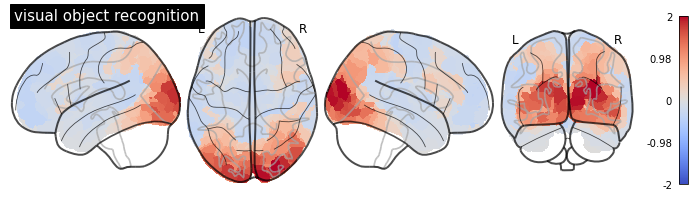

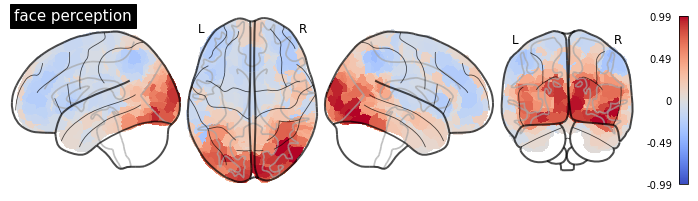

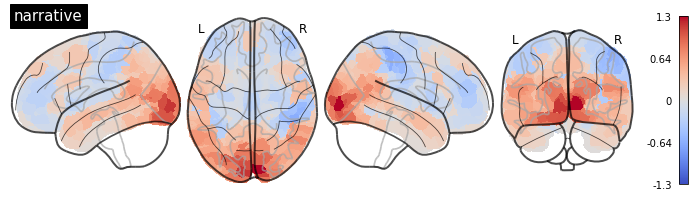

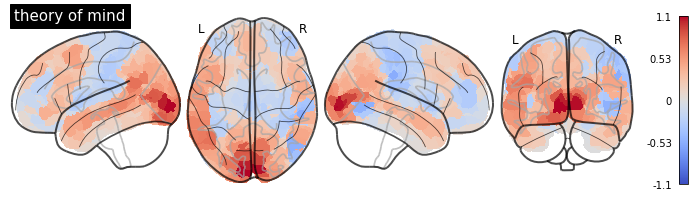

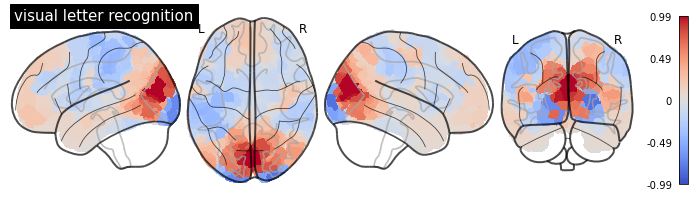


Somatomotor Network


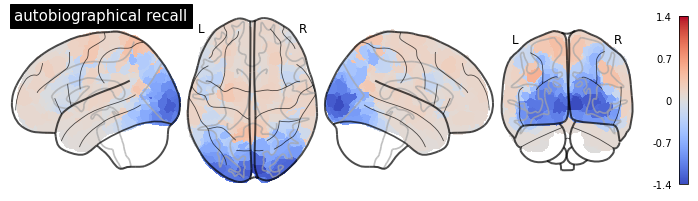

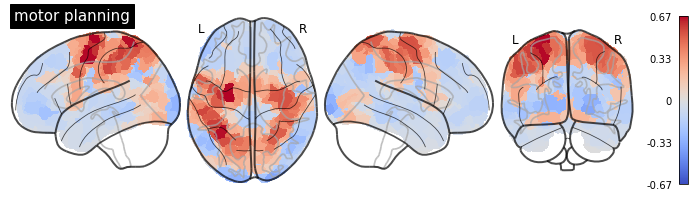

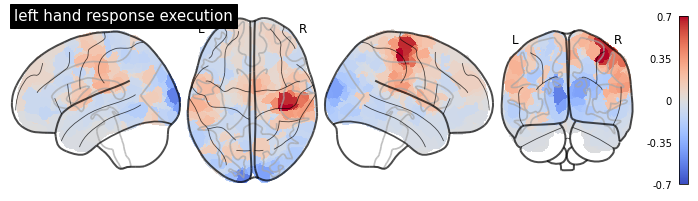

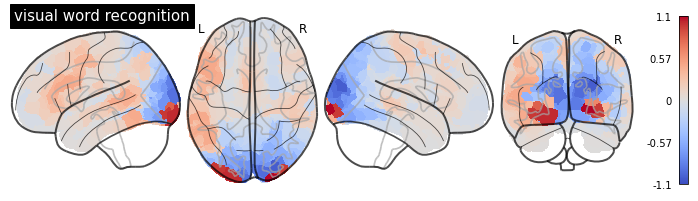

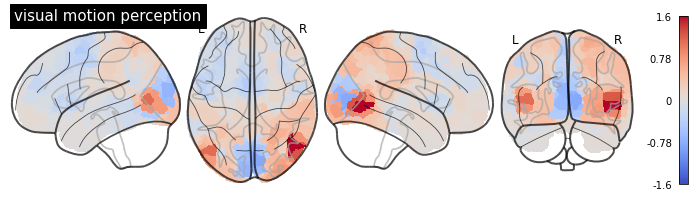


Dorsal Attention Network


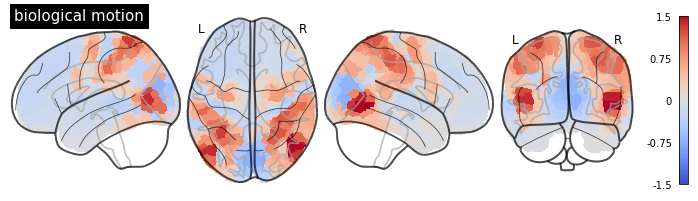

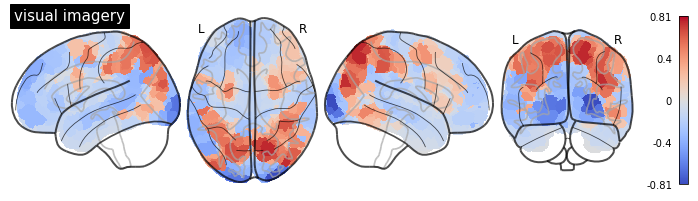

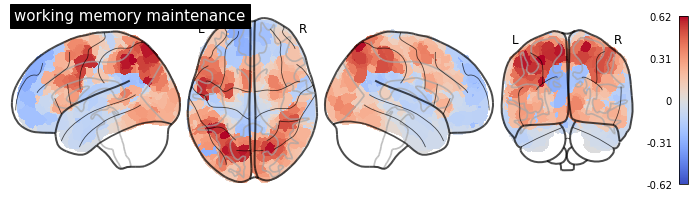

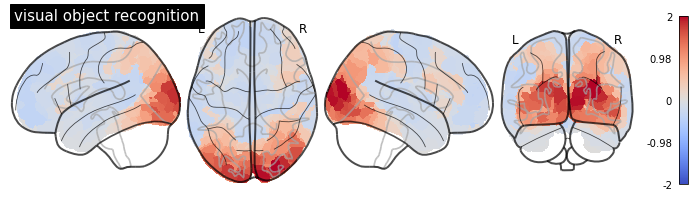

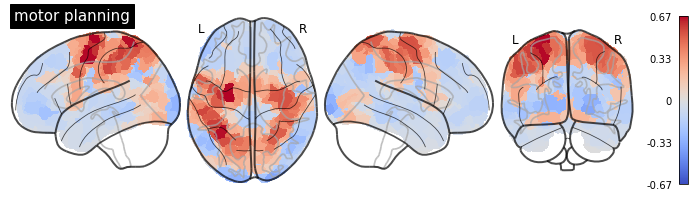


Ventral Attention / Salience Network


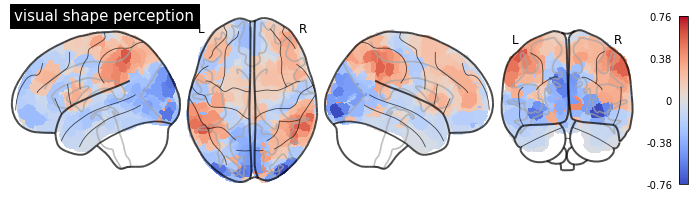

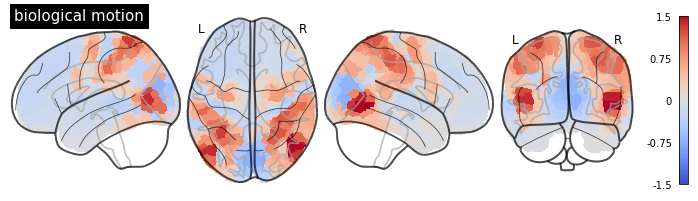

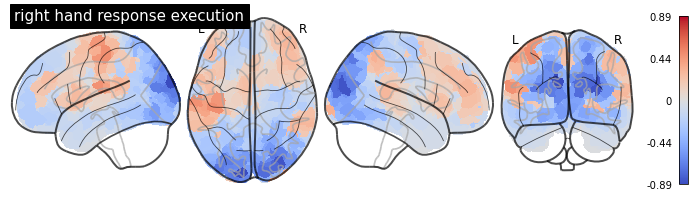

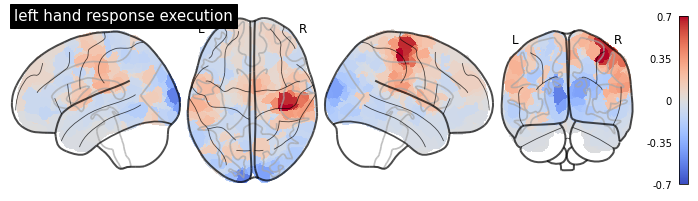

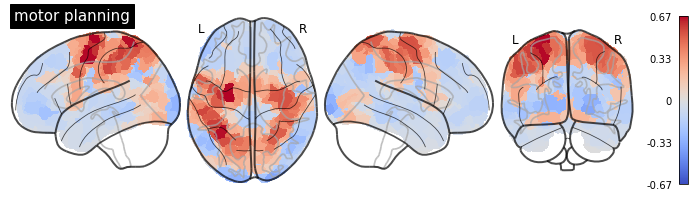


Limbic Network


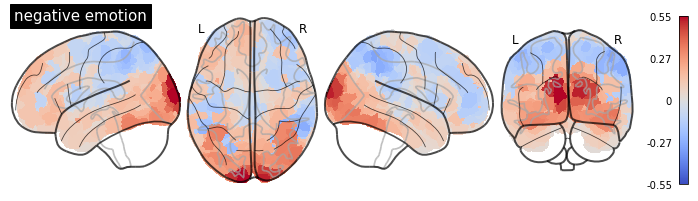

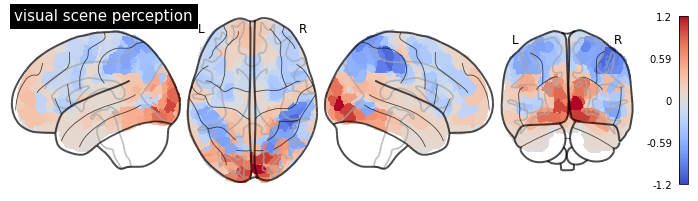

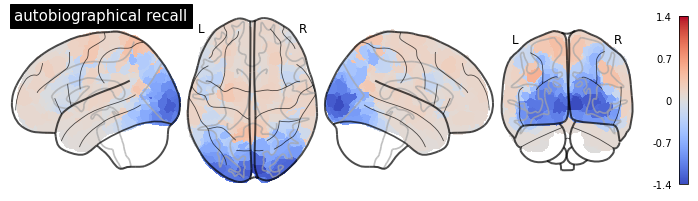

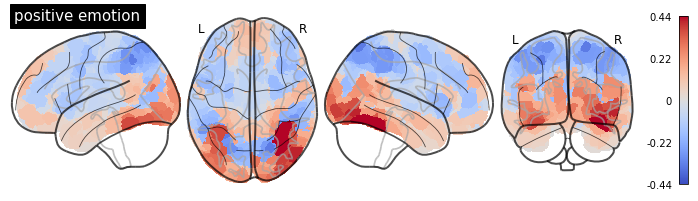

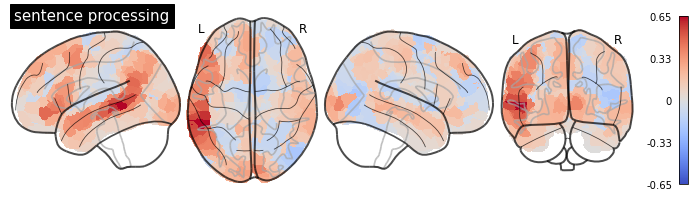


Frontoparietal Control Network


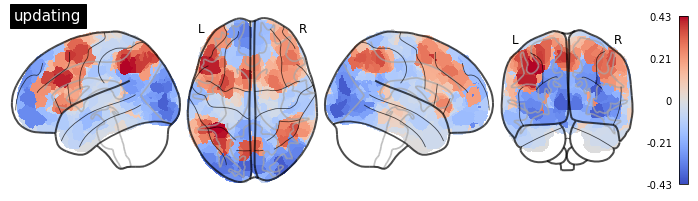

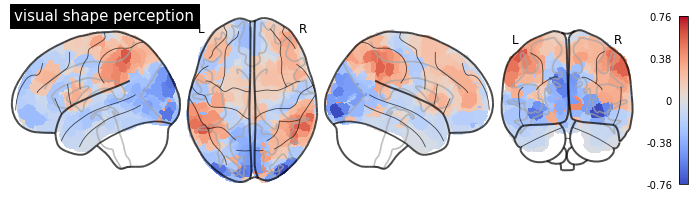

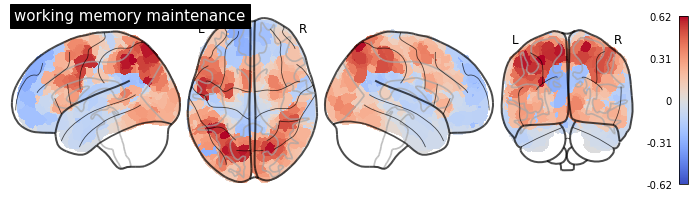

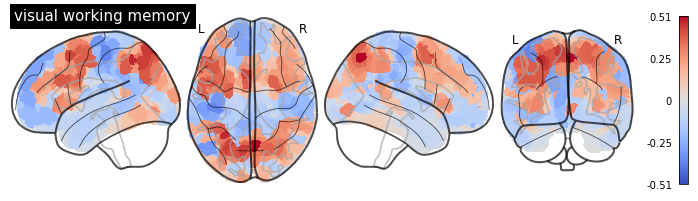

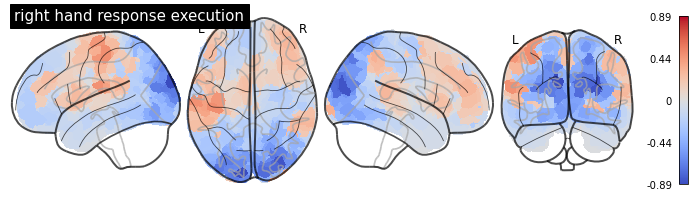


Default Mode Network


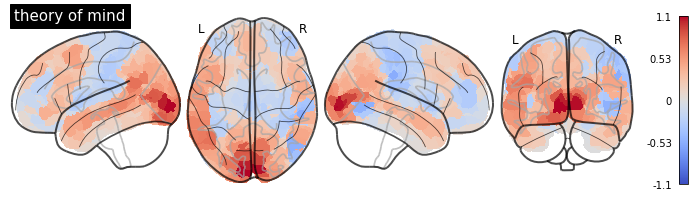

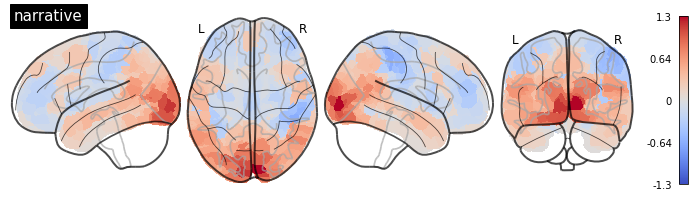

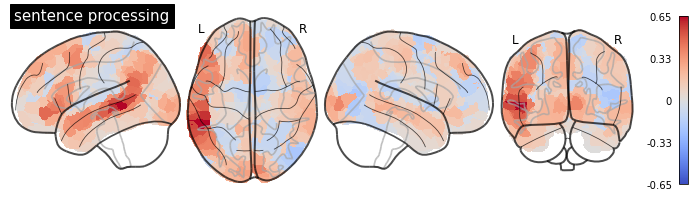

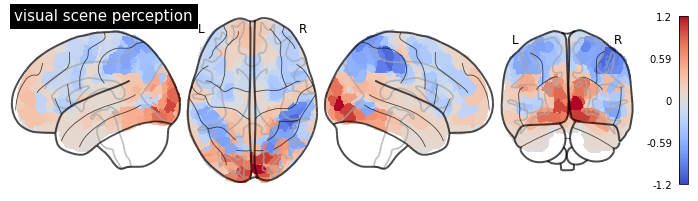

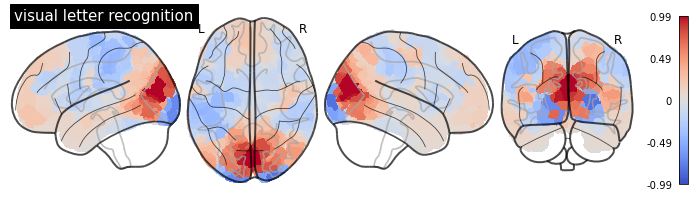

In [8]:
map_outdir = os.path.join(figures_dir, 'coefficients/byNetwork')
if not os.path.exists(map_outdir):
    os.makedirs(map_outdir)

file_type = 'png'

for k, v in top5_concept_names.items():
    print()
    print(network_name_dict[k])
    for concept in v:
        ax = plot_concept_weights(concept, avg_betas, masker, concept_idx_dict)  
        network_outdir = os.path.join(map_outdir,
                                      f"{network_name_dict[k].replace(' Network','').replace(' ', '').replace('/', '-')}")
        if not os.path.exists(network_outdir):
            os.makedirs(network_outdir)
        plt.savefig(os.path.join(network_outdir, f'{concept}.{file_type}'))
        plt.show(); plt.close()
        

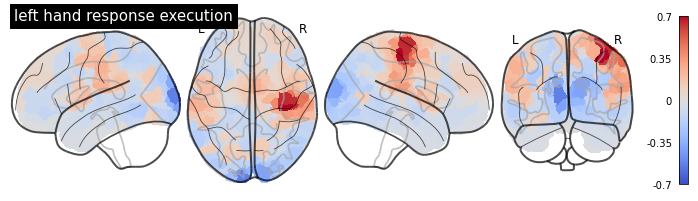

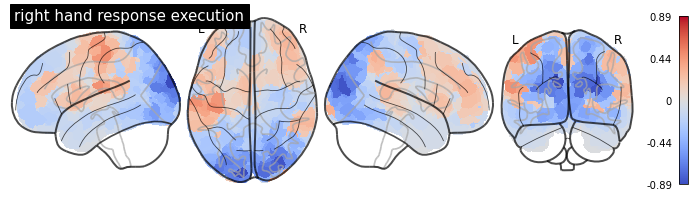

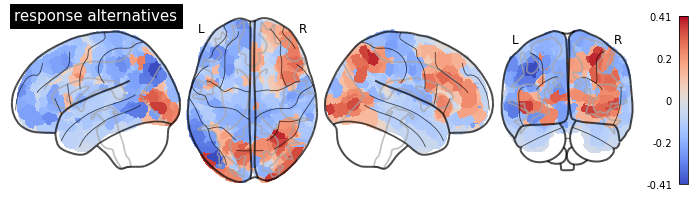

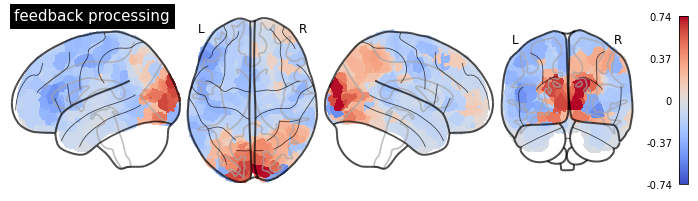

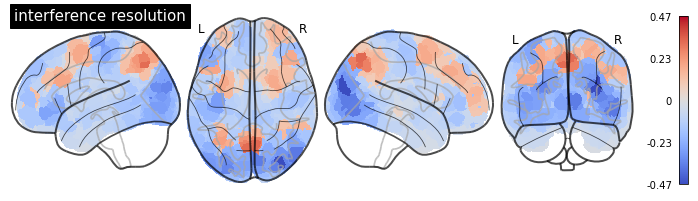

...

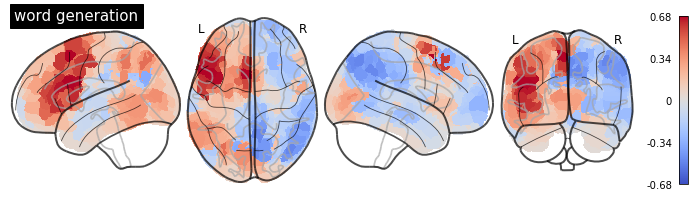

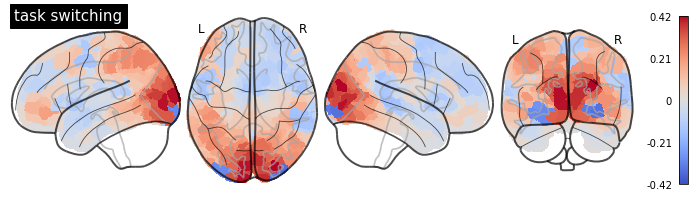

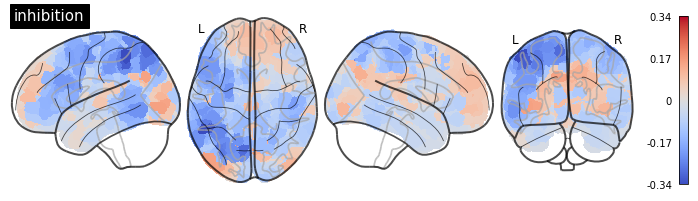

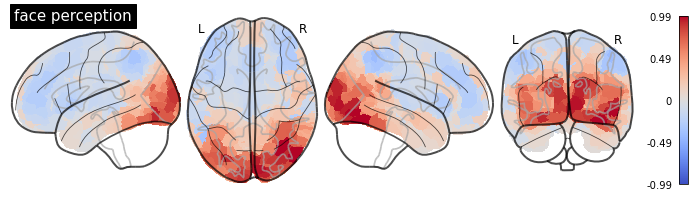

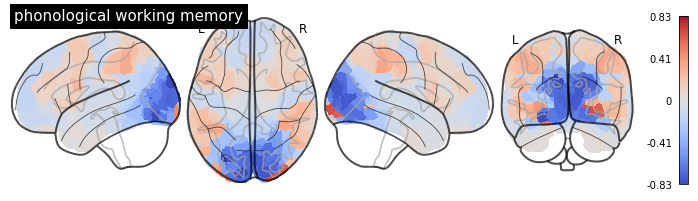

In [24]:
featuremap_outdir = os.path.join(figures_dir, 'coefficients/feature_maps')
if not os.path.exists(featuremap_outdir):
    os.makedirs(featuremap_outdir)

for feature in features:
    out_path = os.path.join(featuremap_outdir, f'{feature}.pdf')
    if not os.path.exists(out_path):
        ax = plot_concept_weights(feature, avg_betas, masker, concept_idx_dict)  
        plt.savefig(out_path)
        plt.show(); plt.close()

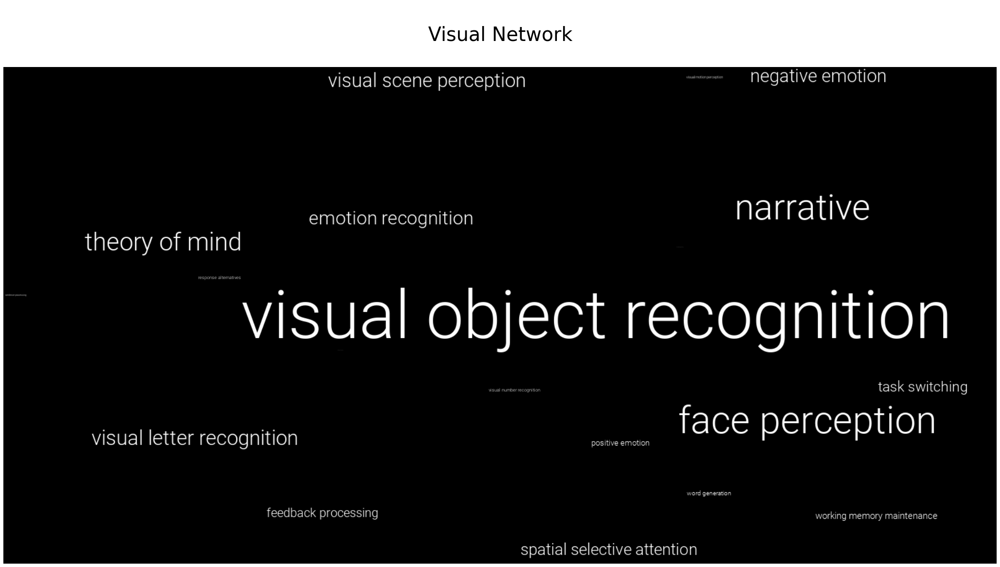

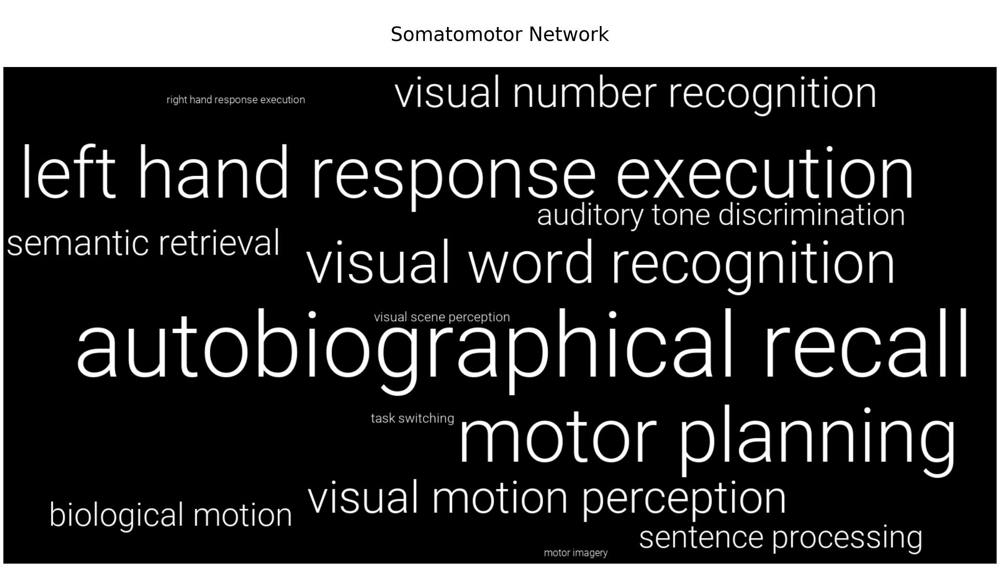

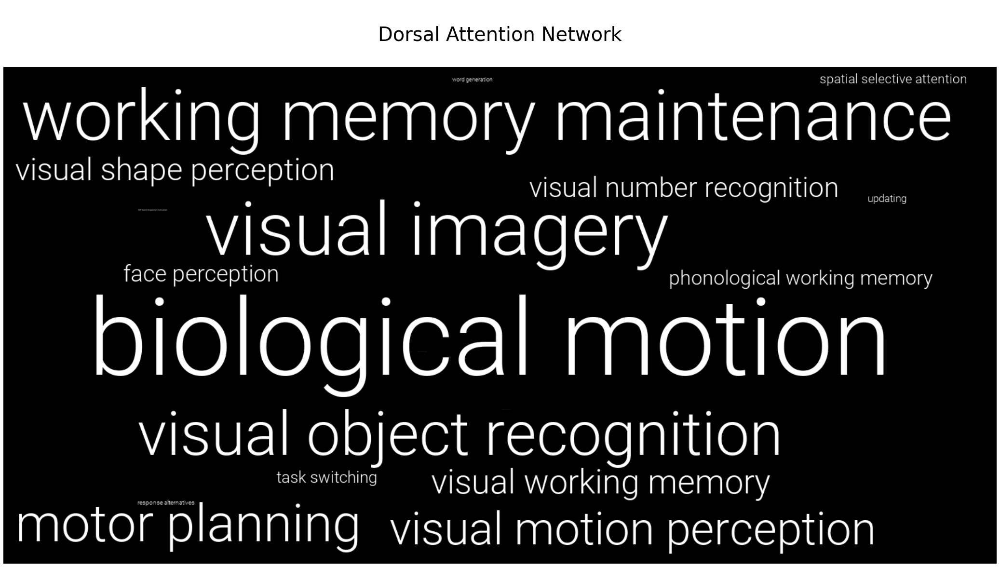

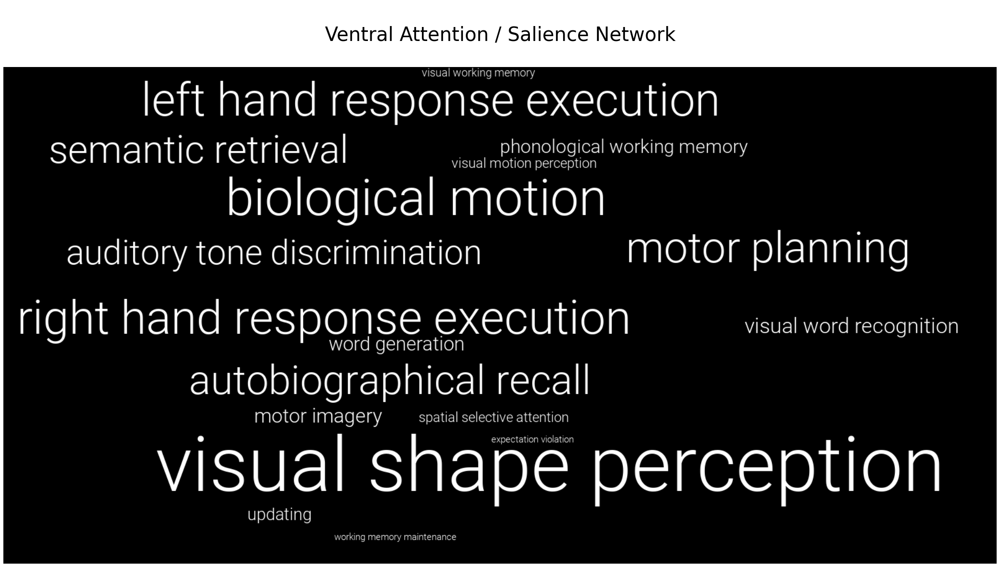

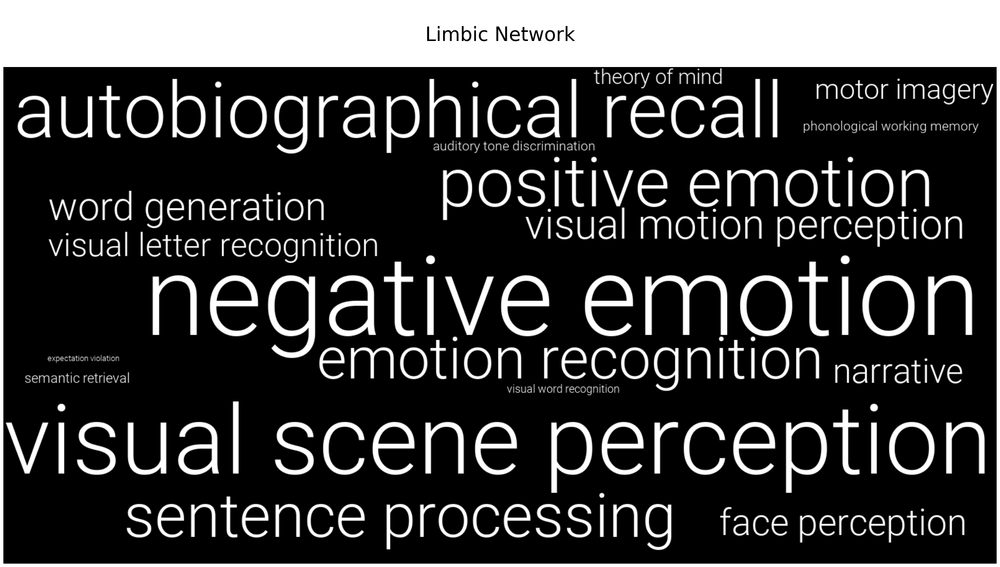

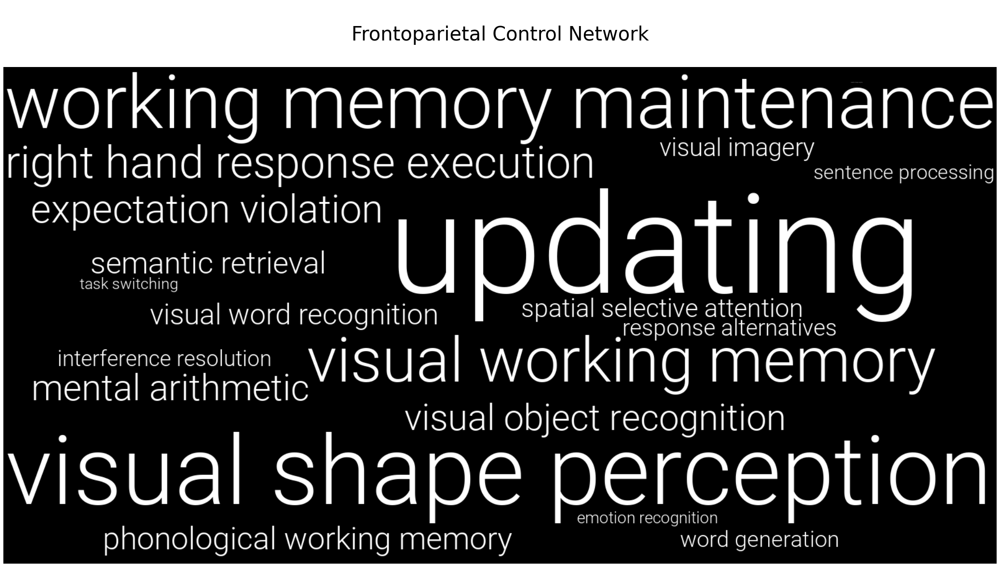

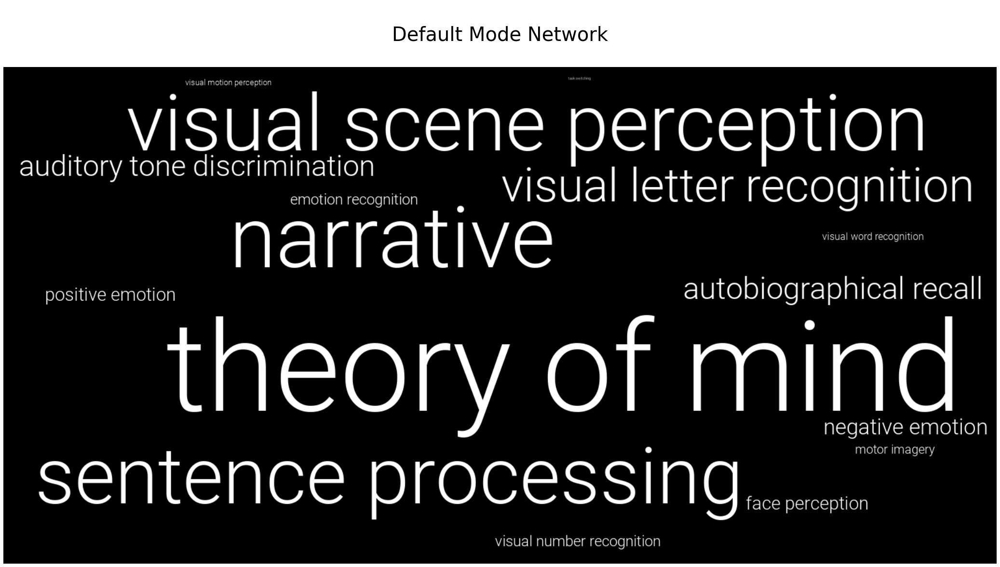

In [170]:
## Word clouds (size = average beta across regions in the network)

font_path = os.path.join(proj_dir, 'resources/fonts/Roboto/Roboto-Light.ttf')

cloud_outdir = os.path.join(figures_dir, 'coefficients/word_clouds')
if not os.path.exists(cloud_outdir):
    os.makedirs(cloud_outdir)
        
    
# Plot
for net in network_dict.keys():
    word_freq_dict = {c:network_dict[net][i] for i,c in enumerate(features) if network_dict[net][i]>0}
    wc = WordCloud(font_path=font_path,
                   width=1600, height=800,
                   background_color='black', 
                   color_func=lambda *args, **kwargs: (255,255,255),
                   min_font_size=0,
                   contour_color='black',
                   max_words=30,
                   prefer_horizontal=1,
                   relative_scaling=1
                  )
    wc = wc.generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=(30,60))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'\n{network_name_dict[net]}\n', fontsize=40)
    plt.tight_layout(pad=5)
    out_fname = os.path.join(cloud_outdir, f'wordcloud_{net}.pdf')
    if not os.path.exists(out_fname):
        plt.savefig(out_fname, bbox_inches='tight')

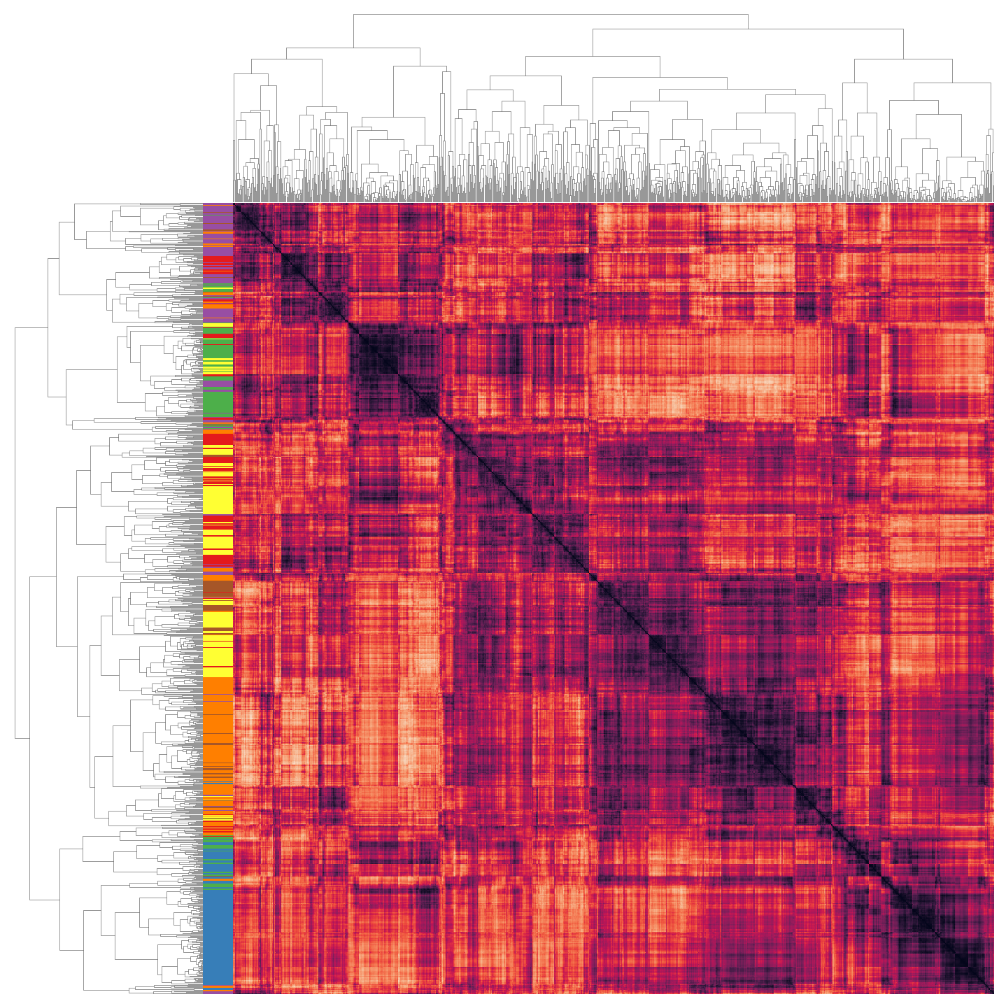

In [375]:
df = avg_betas
similarity_metric = 'correlation'
method = 'average'
vmin = 0
vmax = 2
title = ''

region_labels = []
for i in range(num_parcels):
    for n in network_names:
        if n in parcel_info[1][i]:
            region_labels.append(network_name_dict[n])
            

cmap = 'Set1'
lut = dict(zip(set(region_labels), [plt.get_cmap('Set1')(i) for i in range(len(network_names))]))
row_colors = pd.DataFrame(region_labels)[0].map(lut)

rdm_condensed = sp.spatial.distance.pdist(df, metric=similarity_metric)
rdm = sp.spatial.distance.squareform(rdm_condensed)
linkage = hc.linkage(rdm_condensed, method=method, optimal_ordering=True)

sns.set(font_scale=1)
ax = sns.clustermap(rdm, row_linkage=linkage, col_linkage=linkage,
                    figsize=(20,20), vmin=vmin, vmax=vmax, cbar_pos=None,
                    xticklabels='', yticklabels='',
                    row_colors=[row_colors]
                   )

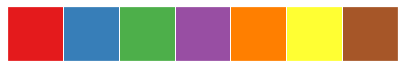

In [404]:
sns.palplot([plt.get_cmap('Set1')(i) for i in range(len(network_names))])

In [173]:
region_similarities = np.corrcoef(avg_betas)
r1_vec = np.triu_indices_from(region_similarities, k=0)[0]
r2_vec = np.triu_indices_from(region_similarities, k=0)[1]


corr_df_allNetworks = pd.DataFrame(columns=['corr', 'type', 'network'])
for n in network_names:
    within_network_indices = np.where(np.array(region_labels)==network_name_dict[n])[0]

    mask = []
    for i in range(len(r1_vec)):
        if r1_vec[i] == r2_vec[i]:
            mask.append(-1)
        else:
            if (r1_vec[i] in within_network_indices) and r2_vec[i] in within_network_indices:
                mask.append(1)
            else:
                mask.append(0)
    mask = np.array(mask)

    within_corrs = region_similarities[(r1_vec[np.where(mask==1)], r2_vec[np.where(mask==1)])]
    between_corrs = region_similarities[(r1_vec[np.where(mask==0)], r2_vec[np.where(mask==0)])]
    corr_df = pd.DataFrame(np.hstack([within_corrs, between_corrs]), columns=['corr'])
    corr_df['type'] = np.hstack([['within' for i in range(within_corrs.shape[0])],
                                ['between' for i in range(between_corrs.shape[0])]])
    corr_df['network'] = n
    
    corr_df_allNetworks = pd.concat([corr_df_allNetworks, corr_df])

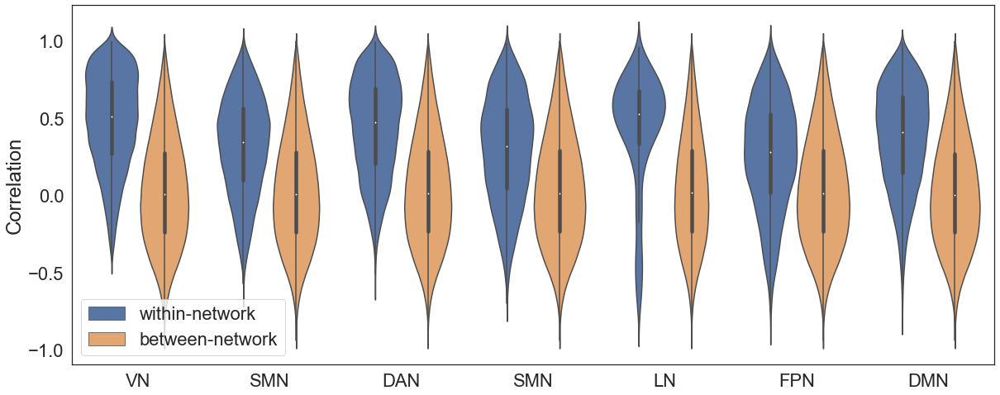

In [189]:
sns.set(style='white', font_scale=2)
palette = ['b','sandybrown']

plt.figure(figsize=(20,8));
ax = sns.violinplot(x='network', y='corr', hue='type', data=corr_df_allNetworks, palette=palette)
ax.set_xlabel('')
ax.set_ylabel('Correlation')
ax.set_xticklabels(['VN', 'SMN', 'DAN', 'SMN', 'LN', 'FPN', 'DMN']);
ax.legend_.set_title(None)
new_labels = ['within-network', 'between-network']
for t, l in zip(ax.legend_.texts, new_labels):
    t.set_text(l)

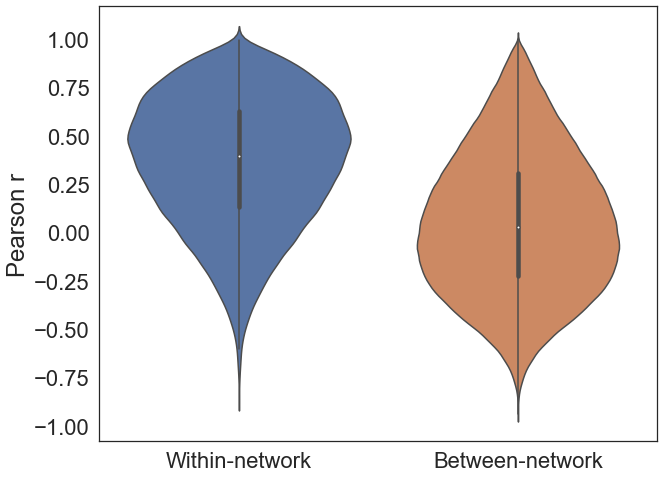

In [409]:
sns.set(style='white', font_scale=2)
palette = ['b','sandybrown']

plt.figure(figsize=(10,8));
ax = sns.violinplot(x='type', y='corr', data=corr_df_allNetworks)
ax.set_xlabel('')
ax.set_ylabel('Pearson r')
ax.set_xticklabels(['Within-network', 'Between-network']);

In [338]:
print(corr_df_allNetworks.groupby('type')['corr'].mean())
print()
print(corr_df_allNetworks.groupby('type')['corr'].std())

type
between    0.049771
within     0.366036
Name: corr, dtype: float64

type
between    0.361225
within     0.333326
Name: corr, dtype: float64


In [266]:
# Regional similarities 
region_similarities = np.corrcoef(avg_betas)

corr_df_allNetworks = pd.DataFrame(columns=['corr', 'type', 'network'])
for n in network_names:  
    within_network_indices = np.where(np.array(region_labels)==network_name_dict[n])[0]
    between_network_indices = np.where(np.array(region_labels)!=network_name_dict[n])[0]

    sims_within = region_similarities[within_network_indices][:, within_network_indices]
    sims_within = sims_within[np.triu_indices_from(sims_within, k=1)]

    sims_between = region_similarities[between_network_indices][:, between_network_indices]
    sims_between = sims_between[np.triu_indices_from(sims_between, k=1)]

    corr_df = pd.DataFrame(np.hstack([sims_within, sims_between]), columns=['corr'])

    corr_df['type'] = np.hstack([['within' for i in range(sims_within.shape[0])],
                                 ['between' for i in range(sims_between.shape[0])]])
    corr_df['network'] = n

    corr_df_allNetworks = pd.concat([corr_df_allNetworks, corr_df])

In [317]:
# Permutation test
num_sims = 100
temp_df = corr_df_allNetworks.copy()
mean_diffs = []
for i in range(num_sims):
    if i%10==0:
        print(i)
    temp_df['corr'] = temp_df['corr'].sample(frac=1).to_list()
    mean_within = temp_df[temp_df['type']=='within']['corr'].mean()
    mean_between = temp_df[temp_df['type']=='between']['corr'].mean()
    mean_diff = mean_within - mean_between
    mean_diffs.append(mean_diff)

0
10
20
30
40
50
60
70
80
90


(array([ 6., 18., 18., 26., 20.,  5.,  4.,  1.,  1.,  1.]),
 array([-0.00315819, -0.00224233, -0.00132647, -0.0004106 ,  0.00050526,
         0.00142112,  0.00233699,  0.00325285,  0.00416871,  0.00508458,
         0.00600044]),
 <BarContainer object of 10 artists>)

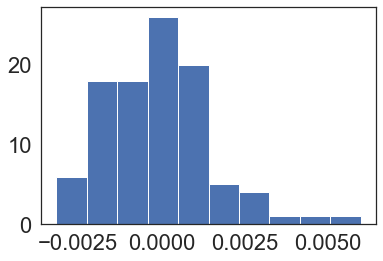

In [410]:
plt.hist(mean_diffs)